# UNGI sagittal-spine dataset — inspection and safe preprocessing

This notebook is the **data stage only**. It audits the `q000/.../Image` and `Mask` pairs, shows raw overlays, detects geometry/label/duplicate problems, and then exports case-grouped arrays that can be consumed by a 2D U-Net.

Important differences from the earlier SUBB notebook:

- no crop or mask flip is inherited from the old dataset;
- pairing is verified inside each `q...` case;
- masks are never resized with bilinear interpolation;
- cases—not individual frames—remain the independent units for later splitting;
- export requires an explicit visual-alignment confirmation.

Run Sections 1–7 first. Inspect every overlay. Only then set `CONFIRM_RAW_OVERLAYS_ARE_ALIGNED = True` in Section 8 and run the remaining cells.


In [22]:
from pathlib import Path
from collections import Counter
import hashlib
import json
import math
import re
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image, ImageOps
from scipy import ndimage
from numpy.lib.format import open_memmap

plt.rcParams["figure.dpi"] = 115
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 100)

# Kaggle locations. Normally no change is required.
KAGGLE_INPUT = Path("/kaggle/input")
OUTPUT_ROOT = Path("/kaggle/working/ungi_spine_preprocessed")

# Supported single-image formats. Add an extension only if its reader is handled below.
SUPPORTED_EXTENSIONS = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff", ".npy"}
CASE_PATTERN = re.compile(r"^q\d+$", re.IGNORECASE)
RANDOM_SEED = 42
QA_SAMPLES_PER_CASE = 5

print("Input search root:", KAGGLE_INPUT)
print("Preprocessing output:", OUTPUT_ROOT)


Input search root: /kaggle/input
Preprocessing output: /kaggle/working/ungi_spine_preprocessed


## 1. Locate the structured dataset and its optional index

The expected root contains `q000`, `q001`, …, each with an `Image` and a `Mask` directory. If Kaggle contains more than one matching copy, the notebook stops instead of guessing.


In [23]:
def natural_key(value):
    return tuple(int(part) if part.isdigit() else part.lower()
                 for part in re.split(r"(\d+)", str(value)))


def candidate_dataset_roots(search_root):
    candidates = []
    for path in search_root.rglob("sagittal_spine_data_structured"):
        if not path.is_dir():
            continue
        case_dirs = [p for p in path.iterdir() if p.is_dir() and CASE_PATTERN.fullmatch(p.name)]
        if case_dirs:
            candidates.append(path)
    return sorted(set(candidates), key=lambda p: natural_key(str(p)))


ROOT_CANDIDATES = candidate_dataset_roots(KAGGLE_INPUT)
if len(ROOT_CANDIDATES) != 1:
    raise RuntimeError(
        "Expected exactly one 'sagittal_spine_data_structured' root, "
        f"found {len(ROOT_CANDIDATES)}:\n" + "\n".join(map(str, ROOT_CANDIDATES))
    )

DATASET_ROOT = ROOT_CANDIDATES[0]
CASE_DIRS = sorted(
    [p for p in DATASET_ROOT.iterdir() if p.is_dir() and CASE_PATTERN.fullmatch(p.name)],
    key=lambda p: natural_key(p.name),
)
CASES = [p.name for p in CASE_DIRS]

print("Dataset root:", DATASET_ROOT)
print("Cases:", CASES)
print("Number of cases:", len(CASES))


Dataset root: /kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structured
Cases: ['q000', 'q001', 'q002', 'q003', 'q004', 'q005', 'q006', 'q007']
Number of cases: 8


In [24]:
index_candidates = sorted(
    [p for p in DATASET_ROOT.parent.rglob("sagittal_spine_data_structured_index*") if p.is_file()],
    key=lambda p: natural_key(str(p)),
)

def read_index(path):
    suffix = path.suffix.lower()
    if suffix in {".xlsx", ".xls"}:
        return pd.read_excel(path)
    if suffix == ".csv":
        return pd.read_csv(path)
    if suffix in {".tsv", ".txt"}:
        return pd.read_csv(path, sep=None, engine="python")
    return None

if index_candidates:
    print("Index candidates:")
    for p in index_candidates:
        print(" ", p)
    index_df = read_index(index_candidates[0])
    if index_df is not None:
        display(index_df.head(10))
        print("Index shape:", index_df.shape)
    else:
        print("The index extension is not automatically readable; folder data will still be audited.")
else:
    print("No separate index file found. This is not required for image/mask inspection.")


Index candidates:
  /kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structured/sagittal_spine_data_structured_index.csv


,case_id,source_dataset,source_image_path,source_mask_path,output_case_dir,output_image_path,output_mask_path,source_image_shape,source_mask_shape,saved_image_shape,saved_mask_shape,source_image_dtype,source_mask_dtype,saved_image_dtype,saved_mask_dtype,shape_match,z_match,hw_match,image_min,image_max,mask_unique_values,foreground_pixels,total_pixels,foreground_fraction,error
0,q000,sagittal_ultrasound_spine,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q000_ultrasound.npy,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q000_segmentation.npy,/kaggle/working/sagittal_spine_data_structured/q000,/kaggle/working/sagittal_spine_data_structured/q000/Image/img.npy,/kaggle/working/sagittal_spine_data_structured/q000/Mask/lbl.npy,523x128x128,523x128x128,523x128x128,523x128x128,float16,uint8,float16,uint8,True,True,True,0.0,1.0,"[0, 1]",23983,8568832,0.002799,NaN
1,q001,sagittal_ultrasound_spine,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q001_ultrasound.npy,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q001_segmentation.npy,/kaggle/working/sagittal_spine_data_structured/q001,/kaggle/working/sagittal_spine_data_structured/q001/Image/img.npy,/kaggle/working/sagittal_spine_data_structured/q001/Mask/lbl.npy,355x128x128,355x128x128,355x128x128,355x128x128,float16,uint8,float16,uint8,True,True,True,0.0,1.0,"[0, 1]",14561,5816320,0.002503,NaN
2,q002,sagittal_ultrasound_spine,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q002_ultrasound.npy,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q002_segmentation.npy,/kaggle/working/sagittal_spine_data_structured/q002,/kaggle/working/sagittal_spine_data_structured/q002/Image/img.npy,/kaggle/working/sagittal_spine_data_structured/q002/Mask/lbl.npy,477x128x128,477x128x128,477x128x128,477x128x128,float16,uint8,float16,uint8,True,True,True,0.0,1.0,"[0, 1]",22485,7815168,0.002877,NaN
3,q003,sagittal_ultrasound_spine,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q003_ultrasound.npy,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q003_segmentation.npy,/kaggle/working/sagittal_spine_data_structured/q003,/kaggle/working/sagittal_spine_data_structured/q003/Image/img.npy,/kaggle/working/sagittal_spine_data_structured/q003/Mask/lbl.npy,453x128x128,453x128x128,453x128x128,453x128x128,float16,uint8,float16,uint8,True,True,True,0.0,1.0,"[0, 1]",29795,7421952,0.004014,NaN
4,q004,sagittal_ultrasound_spine,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q004_ultrasound.npy,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q004_segmentation.npy,/kaggle/working/sagittal_spine_data_structured/q004,/kaggle/working/sagittal_spine_data_structured/q004/Image/img.npy,/kaggle/working/sagittal_spine_data_structured/q004/Mask/lbl.npy,289x128x128,289x128x128,289x128x128,289x128x128,float16,uint8,float16,uint8,True,True,True,0.0,1.0,"[0, 1]",12342,4734976,0.002607,NaN
5,q005,sagittal_ultrasound_spine,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q005_ultrasound.npy,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q005_segmentation.npy,/kaggle/working/sagittal_spine_data_structured/q005,/kaggle/working/sagittal_spine_data_structured/q005/Image/img.npy,/kaggle/working/sagittal_spine_data_structured/q005/Mask/lbl.npy,387x128x128,387x128x128,387x128x128,387x128x128,float16,uint8,float16,uint8,True,True,True,0.0,1.0,"[0, 1]",22694,6340608,0.003579,NaN
6,q006,sagittal_ultrasound_spine,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q006_ultrasound.npy,/kaggle/input/datasets/mahboobsaeedi/axial-ulrtasound-spine/q006_segmentation.npy,/kaggle/working/sagittal_spine_data_structured/q006,/kaggle/working/sagittal_spine_data_structured/q006/Image/img.npy,/kaggle/working/sagittal_spine_data_structured/q006/Mask/lbl.npy,360x128x128,360x128x128,360x128x128,360x128x128,float16,uint8,float16,uint8,True,True,True,0.0,1.0,"[0, 1]",24965,5898240,0.004233,NaN
7,q007,sagittal_ultrasound_spi

Index shape: (8, 25)


## 2. Discover one image-volume/mask-volume pair per case

In this dataset, each `q.../Image/img.npy` contains a complete frame stack and the corresponding `q.../Mask/lbl.npy` contains its mask stack. Therefore pairing is performed at the **case-volume level**, not by matching the generic filenames `img` and `lbl`. The following cell still stops if a case contains zero or multiple candidate volumes.


In [25]:
def find_named_child(case_dir, target):
    matches = [p for p in case_dir.iterdir() if p.is_dir() and p.name.lower() == target.lower()]
    if len(matches) != 1:
        raise RuntimeError(f"{case_dir.name}: expected one {target!r} directory, found {matches}")
    return matches[0]


def list_supported_files(folder):
    return sorted(
        [p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in SUPPORTED_EXTENSIONS],
        key=lambda p: natural_key(str(p.relative_to(folder))),
    )


PAIR_ROWS = []
PAIRING_ISSUES = []
for case_dir in CASE_DIRS:
    image_dir = find_named_child(case_dir, "Image")
    mask_dir = find_named_child(case_dir, "Mask")
    image_files = list_supported_files(image_dir)
    mask_files = list_supported_files(mask_dir)

    issue = {
        "case": case_dir.name,
        "image_volume_files": len(image_files),
        "mask_volume_files": len(mask_files),
        "image_names": [p.name for p in image_files],
        "mask_names": [p.name for p in mask_files],
    }
    PAIRING_ISSUES.append(issue)

    if len(image_files) == 1 and len(mask_files) == 1:
        PAIR_ROWS.append({
            "case": case_dir.name,
            "image_path": image_files[0],
            "mask_path": mask_files[0],
        })

pairing_df = pd.DataFrame(PAIRING_ISSUES).set_index("case")
display(pairing_df)

bad_pairing = pairing_df[
    (pairing_df["image_volume_files"] != 1)
    | (pairing_df["mask_volume_files"] != 1)
]
if len(bad_pairing):
    display(bad_pairing)
    raise RuntimeError("Every case must contain exactly one image volume and one mask volume.")

PAIRS = pd.DataFrame(PAIR_ROWS).sort_values("case", key=lambda s: s.map(natural_key)).reset_index(drop=True)
if len(PAIRS) != len(CASES):
    raise RuntimeError(f"Expected {len(CASES)} case pairs, found {len(PAIRS)}")
print("Verified case-level volume pairs:", len(PAIRS))
display(PAIRS)


,image_volume_files,mask_volume_files,image_names,mask_names
case,,,,
q000,1,1,[img.npy],[lbl.npy]
q001,1,1,[img.npy],[lbl.npy]
q002,1,1,[img.npy],[lbl.npy]
q003,1,1,[img.npy],[lbl.npy]
q004,1,1,[img.npy],[lbl.npy]
q005,1,1,[img.npy],[lbl.npy]
q006,1,1,[img.npy],[lbl.npy]
q007,1,1,[img.npy],[lbl.npy]


Verified case-level volume pairs: 8


,case,image_path,mask_path
0,q000,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...
1,q001,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...
2,q002,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...
3,q003,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...
4,q004,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...
5,q005,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...
6,q006,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...
7,q007,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...


## 3. Open the volumes and audit every frame

The `.npy` files have shapes such as `523×128×128`: `(frames, height, width)`. They are opened with memory mapping, checked for equal frame counts and spatial dimensions, and then audited frame by frame. The tables record intensity ranges, mask values, foreground size, connected components, bounding boxes, edge contact, and content hashes without confusing a frame stack with an RGB image.


In [26]:
def open_volume(path):
    if path.suffix.lower() != ".npy":
        raise ValueError(
            f"This structured dataset is expected to use .npy volumes; found {path.name}. "
            "Add a volume reader explicitly before proceeding."
        )
    array = np.load(path, mmap_mode="r", allow_pickle=False)
    if array.ndim == 4 and array.shape[-1] == 1:
        array = array[..., 0]
    if array.ndim != 3:
        raise ValueError(f"Expected (frames,H,W), got {array.shape} in {path}")
    return array


def image_to_gray(frame):
    frame = np.asarray(frame)
    if frame.ndim == 2:
        return frame
    if frame.ndim == 3 and frame.shape[-1] == 1:
        return frame[..., 0]
    if frame.ndim == 3 and frame.shape[-1] in (3, 4):
        rgb = frame[..., :3].astype(np.float32)
        return 0.2126 * rgb[..., 0] + 0.7152 * rgb[..., 1] + 0.0722 * rgb[..., 2]
    raise ValueError(f"Unsupported frame shape: {frame.shape}")


def mask_to_scalar(frame):
    frame = np.asarray(frame)
    if frame.ndim == 2:
        return frame
    if frame.ndim == 3 and frame.shape[-1] == 1:
        return frame[..., 0]
    if frame.ndim == 3 and frame.shape[-1] in (3, 4):
        rgb = frame[..., :3]
        if np.array_equal(rgb[..., 0], rgb[..., 1]) and np.array_equal(rgb[..., 0], rgb[..., 2]):
            return rgb[..., 0]
        colors = np.unique(rgb.reshape(-1, 3), axis=0)
        raise ValueError(
            f"Color-coded mask with {len(colors)} colors. Define an explicit class mapping; "
            "do not convert it to grayscale."
        )
    raise ValueError(f"Unsupported mask-frame shape: {frame.shape}")


def canonical_hash(array):
    contiguous = np.ascontiguousarray(array)
    h = hashlib.sha256()
    h.update(str(contiguous.shape).encode())
    h.update(str(contiguous.dtype).encode())
    h.update(contiguous.tobytes())
    return h.hexdigest()


def binary_mask_from_raw(mask):
    mask = np.asarray(mask)
    if not np.isfinite(mask).all():
        raise ValueError("Mask contains NaN or infinity")
    values = np.unique(mask)
    if set(values.tolist()).issubset({0, 1}):
        return (mask > 0).astype(np.uint8)
    if set(values.tolist()).issubset({0, 255}):
        return (mask >= 128).astype(np.uint8)
    if len(values) == 1:
        return np.zeros(mask.shape, dtype=np.uint8) if values[0] == 0 else np.ones(mask.shape, dtype=np.uint8)
    mmin, mmax = float(mask.min()), float(mask.max())
    normalized = (mask.astype(np.float32) - mmin) / max(mmax - mmin, 1e-12)
    return (normalized >= 0.5).astype(np.uint8)


def bbox_from_binary(mask):
    ys, xs = np.nonzero(mask)
    if not len(xs):
        return None
    return int(ys.min()), int(xs.min()), int(ys.max()) + 1, int(xs.max()) + 1


VOLUMES = {}
volume_rows = []
audit_rows = []
load_failures = []

for pair in PAIRS.itertuples(index=False):
    try:
        images = open_volume(pair.image_path)
        masks = open_volume(pair.mask_path)
        if images.shape != masks.shape:
            raise ValueError(f"volume mismatch: images {images.shape}, masks {masks.shape}")
        if not np.isfinite(images).all() or not np.isfinite(masks).all():
            raise ValueError("Image or mask volume contains NaN/infinity")
        VOLUMES[pair.case] = {"images": images, "masks": masks}
        volume_rows.append({
            "case": pair.case,
            "frames": images.shape[0],
            "height": images.shape[1],
            "width": images.shape[2],
            "image_dtype": str(images.dtype),
            "mask_dtype": str(masks.dtype),
            "image_min": float(images.min()),
            "image_max": float(images.max()),
            "mask_values": np.unique(masks).tolist(),
        })

        for frame_index in range(images.shape[0]):
            image = image_to_gray(images[frame_index])
            mask_scalar = mask_to_scalar(masks[frame_index])
            if image.shape != mask_scalar.shape:
                raise ValueError(
                    f"frame {frame_index} mismatch: image {image.shape}, mask {mask_scalar.shape}"
                )
            binary = binary_mask_from_raw(mask_scalar)
            fg = int(binary.sum())
            bbox = bbox_from_binary(binary)
            components = int(ndimage.label(binary)[1]) if fg else 0
            edge_touch = bool(
                fg and (binary[0].any() or binary[-1].any() or binary[:, 0].any() or binary[:, -1].any())
            )
            values = np.unique(mask_scalar)
            values_preview = values.tolist() if len(values) <= 16 else [float(values.min()), "...", float(values.max())]
            image_min = float(np.min(image))
            image_max = float(np.max(image))
            audit_rows.append({
                "case": pair.case,
                "frame_index": frame_index,
                "sample_key": f"frame_{frame_index:04d}",
                "image_path": pair.image_path,
                "mask_path": pair.mask_path,
                "image_shape": tuple(image.shape),
                "image_dtype": str(images.dtype),
                "mask_dtype": str(masks.dtype),
                "image_min": image_min,
                "image_max": image_max,
                "image_std": float(np.std(image.astype(np.float32))),
                "mask_min": float(np.min(mask_scalar)),
                "mask_max": float(np.max(mask_scalar)),
                "mask_unique_count": int(len(values)),
                "mask_values_preview": values_preview,
                "foreground_pixels": fg,
                "foreground_fraction": fg / binary.size,
                "components": components,
                "bbox_y1_x1_y2_x2": bbox,
                "touches_image_edge": edge_touch,
                "image_hash": canonical_hash(image),
                "mask_hash": canonical_hash(binary),
                "pair_hash": canonical_hash(np.stack([image.astype(np.float32), binary.astype(np.float32)])),
            })
    except Exception as exc:
        load_failures.append({"case": pair.case, "error": repr(exc)})

if load_failures:
    display(pd.DataFrame(load_failures))
    raise RuntimeError("At least one case volume cannot be safely read. Resolve the failures before export.")

VOLUME_INVENTORY = pd.DataFrame(volume_rows).set_index("case")
AUDIT = pd.DataFrame(audit_rows)
display(VOLUME_INVENTORY)
print("Fully audited frames:", len(AUDIT))
display(AUDIT.head())


,frames,height,width,image_dtype,mask_dtype,image_min,image_max,mask_values
case,,,,,,,,
q000,523,128,128,float16,uint8,0.0,1.0,"[0, 1]"
q001,355,128,128,float16,uint8,0.0,1.0,"[0, 1]"
q002,477,128,128,float16,uint8,0.0,1.0,"[0, 1]"
q003,453,128,128,float16,uint8,0.0,1.0,"[0, 1]"
q004,289,128,128,float16,uint8,0.0,1.0,"[0, 1]"
q005,387,128,128,float16,uint8,0.0,1.0,"[0, 1]"
q006,360,128,128,float16,uint8,0.0,1.0,"[0, 1]"
q007,446,128,128,float16,uint8,0.0,1.0,"[0, 1]"


Fully audited frames: 3290


,case,frame_index,sample_key,image_path,mask_path,image_shape,image_dtype,mask_dtype,image_min,image_max,image_std,mask_min,mask_max,mask_unique_count,mask_values_preview,foreground_pixels,foreground_fraction,components,bbox_y1_x1_y2_x2,touches_image_edge,image_hash,mask_hash,pair_hash
0,q000,0,frame_0000,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,"(128, 128)",float16,uint8,0.0,1.0,0.136977,0.0,1.0,2,"[0, 1]",77,0.004700,4,"(64, 23, 105, 110)",False,7410533069c8f8a73b2b2e45ff437d50d83bd78fd2bf386d095c19495c1c4e3e,3be66b074bfa8a7eb9b4aef6ef65fbd254e9f9a3f2096b18fa6d8bb8bae79f75,fc314e8f4484dbdb0227928928aa5b54d598af0ca6eb9ec5ad664d4bde6c0f3b
1,q000,1,frame_0001,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,"(128, 128)",float16,uint8,0.0,1.0,0.137161,0.0,1.0,2,"[0, 1]",77,0.004700,4,"(65, 21, 105, 113)",False,f8e20c08d215feeb2ecc3addeebdb1b836f3080f23696e8ec35c698cc69c1b63,651963452e6a3a86baa587cf04afc56e7114ee2225788df1dc4f025778f6cd7f,0c24d24620dff99c3ec54be32edcc6f0d45f796d34c93af8346a8693b1b3a296
2,q000,2,frame_0002,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,"(128, 128)",float16,uint8,0.0,1.0,0.137421,0.0,1.0,2,"[0, 1]",70,0.004272,4,"(64, 22, 105, 109)",False,85eeca40825916909f743e13fd4f097b23e2599679b8acfb7d35ba00f6bc666e,9f6b92ca801068189f5a4e42254637eb0e6ab283d53690ff6f835e6c1647a8c3,3ee8897de2837702b51b8bd614add8207521944b9eed3a1ea4a01692b4ae0103
3,q000,3,frame_0003,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,"(128, 128)",float16,uint8,0.0,1.0,0.138785,0.0,1.0,2,"[0, 1]",64,0.003906,4,"(77, 28, 99, 113)",False,597c67e8c642f3e1876122931c95540060cc984d1d8d307bab33feec4f116596,4cb576d64f7ea15176ea15da78362030dd367a6adc59d56fa9bf182f5f1c2c31,5f075eef838655e76af01c2e75c25d5a2d49244b0711528a76df46624ce3bdd3
4,q000,4,frame_0004,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,/kaggle/input/datasets/amitismirabedini/ungi-dataset/2-Ungi Dataset/sagittal_spine_data_structur...,"(128, 128)",float16,uint8,0.0,1.0,0.140839,0.0,1.0,2,"[0, 1]",88,0.005371,3,"(69, 39, 93, 121)",False,277d6a4d1ded3aa4970d6fb23d9c5c0d5ab41aef03f36b273af85d097958d807,444aacda333246c0f7aea6fb99975d536d1238643489f0182701a2a843775c02,44c686e1c4bd8e465281358d2444c84bb4702cded19fbb71d8321d89aa675477


## 4. Dataset-level diagnostics

Interpret these tables before choosing preprocessing:

- **empty masks** may be valid negative frames, but confirm that they are expected;
- **edge contact** can mean the anatomy is truncated or simply reaches the acquisition boundary;
- **many components** can be anatomically valid, but may also reveal label noise;
- **cross-case duplicates** are a leakage risk and must not appear in different folds.


In [27]:
summary = AUDIT.groupby("case").agg(
    samples=("sample_key", "size"),
    empty_masks=("foreground_pixels", lambda s: int((s == 0).sum())),
    nonempty_masks=("foreground_pixels", lambda s: int((s > 0).sum())),
    median_foreground_fraction=("foreground_fraction", "median"),
    max_foreground_fraction=("foreground_fraction", "max"),
    edge_touching_masks=("touches_image_edge", "sum"),
    max_components=("components", "max"),
    image_min=("image_min", "min"),
    image_max=("image_max", "max"),
).sort_index(key=lambda s: s.map(natural_key))
summary["empty_percent"] = 100 * summary["empty_masks"] / summary["samples"]
summary["edge_touch_percent_of_nonempty"] = (
    100 * summary["edge_touching_masks"] / summary["nonempty_masks"].clip(lower=1)
)
display(summary.round(4))

frame_shape_table = AUDIT.groupby("image_shape").size().rename("frames").sort_values(ascending=False)
volume_shape_table = VOLUME_INVENTORY.groupby(["frames", "height", "width"]).size().rename("cases")
dtype_table = AUDIT.groupby(["image_dtype", "mask_dtype"]).size().rename("frames").sort_values(ascending=False)
mask_value_table = AUDIT.groupby(["mask_min", "mask_max", "mask_unique_count"]).size().rename("frames").sort_values(ascending=False)

print("Frame shapes")
display(frame_shape_table.to_frame())
print("Volume shapes (variable frame counts are expected)")
display(volume_shape_table.to_frame())
print("Dtype combinations")
display(dtype_table.to_frame())
print("Mask value patterns")
display(mask_value_table.to_frame().head(30))


,samples,empty_masks,nonempty_masks,median_foreground_fraction,max_foreground_fraction,edge_touching_masks,max_components,image_min,image_max,empty_percent,edge_touch_percent_of_nonempty
case,,,,,,,,,,,
q000,523,47,476,0.0028,0.0091,2,5,0.0,1.0,8.9866,0.4202
q001,355,90,265,0.0026,0.0089,14,7,0.0,1.0,25.3521,5.2830
q002,477,99,378,0.0031,0.0103,0,5,0.0,1.0,20.7547,0.0000
q003,453,55,398,0.0037,0.0177,2,6,0.0,1.0,12.1413,0.5025
q004,289,42,247,0.0026,0.0082,0,4,0.0,1.0,14.5329,0.0000
q005,387,35,352,0.0038,0.0080,2,8,0.0,1.0,9.0439,0.5682
q006,360,28,332,0.0042,0.0118,1,5,0.0,1.0,7.7778,0.3012
q007,446,29,417,0.0043,0.0091,2,6,0.0,1.0,6.5022,0.4796


Frame shapes


,frames
image_shape,
"(128, 128)",3290


Volume shapes (variable frame counts are expected)


,,,cases
frames,height,width,
289,128,128,1
355,128,128,1
360,128,128,1
387,128,128,1
446,128,128,1
453,128,128,1
477,128,128,1
523,128,128,1


Dtype combinations


,,frames
image_dtype,mask_dtype,
float16,uint8,3290


Mask value patterns


frames
mask_min mask_max mask_unique_count        
0.0      1.0      2                    2865
         0.0      1                     425

In [28]:
duplicate_pairs = AUDIT[AUDIT.duplicated("pair_hash", keep=False)].sort_values("pair_hash")
duplicate_images = AUDIT[AUDIT.duplicated("image_hash", keep=False)].sort_values("image_hash")


def cross_case_groups(frame, hash_column):
    rows = []
    for digest, group in frame.groupby(hash_column):
        cases = sorted(group["case"].unique(), key=natural_key)
        if len(cases) > 1:
            rows.append({
                "hash": digest,
                "cases": cases,
                "samples": group[["case", "frame_index", "sample_key"]].to_dict("records"),
            })
    return pd.DataFrame(rows)


cross_case_pair_duplicates = cross_case_groups(duplicate_pairs, "pair_hash")

# Constant blank frames can legitimately be identical padding/acquisition frames.
# Report them, but only non-constant exact image duplicates are a leakage blocker.
nonconstant_duplicate_images = duplicate_images[duplicate_images["image_std"] > 1e-8]
cross_case_image_duplicates = cross_case_groups(nonconstant_duplicate_images, "image_hash")
constant_cross_case_duplicates = cross_case_groups(
    duplicate_images[duplicate_images["image_std"] <= 1e-8], "image_hash"
)

print("Exact duplicate image+mask frames:", len(duplicate_pairs))
print("Exact duplicate image frames:", len(duplicate_images))
print("Cross-case duplicate pair groups:", len(cross_case_pair_duplicates))
print("Cross-case non-constant duplicate image groups:", len(cross_case_image_duplicates))
print("Cross-case constant/blank duplicate image groups (reported only):", len(constant_cross_case_duplicates))
if len(cross_case_pair_duplicates):
    display(cross_case_pair_duplicates)
if len(cross_case_image_duplicates):
    display(cross_case_image_duplicates)
    warnings.warn("Non-constant cross-case duplicate images can leak between folds. Investigate before training.")


Exact duplicate image+mask frames: 0
Exact duplicate image frames: 4
Cross-case duplicate pair groups: 0
Cross-case non-constant duplicate image groups: 0
Cross-case constant/blank duplicate image groups (reported only): 0


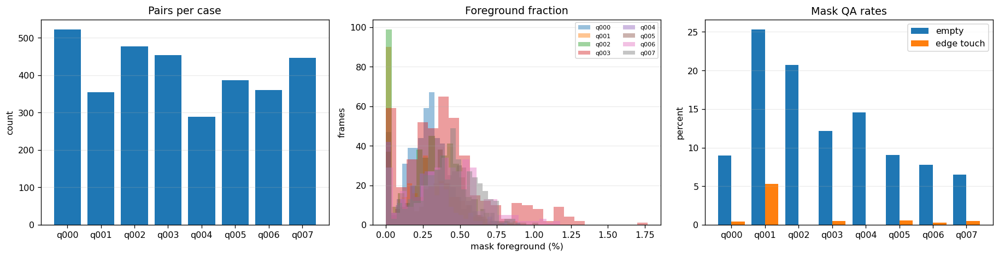

In [29]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4.2))

case_order = sorted(summary.index, key=natural_key)
axes[0].bar(case_order, summary.loc[case_order, "samples"])
axes[0].set_title("Pairs per case")
axes[0].set_ylabel("count")

for case in case_order:
    values = AUDIT.loc[AUDIT.case == case, "foreground_fraction"] * 100
    axes[1].hist(values, bins=25, alpha=0.45, label=case)
axes[1].set_title("Foreground fraction")
axes[1].set_xlabel("mask foreground (%)")
axes[1].set_ylabel("frames")
axes[1].legend(fontsize=7, ncol=2)

empty_pct = summary.loc[case_order, "empty_percent"]
edge_pct = summary.loc[case_order, "edge_touch_percent_of_nonempty"]
x = np.arange(len(case_order))
axes[2].bar(x - 0.2, empty_pct, 0.4, label="empty")
axes[2].bar(x + 0.2, edge_pct, 0.4, label="edge touch")
axes[2].set_xticks(x, case_order)
axes[2].set_ylabel("percent")
axes[2].set_title("Mask QA rates")
axes[2].legend()

for ax in axes:
    ax.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.show()


## 5. Raw visual QA

Each row shows the unmodified image, the raw binary mask, and the overlay. Samples include sequence-spread frames plus large foreground masks. Confirm that the contour follows the intended anatomy for every case and that no horizontal/vertical flip is needed.


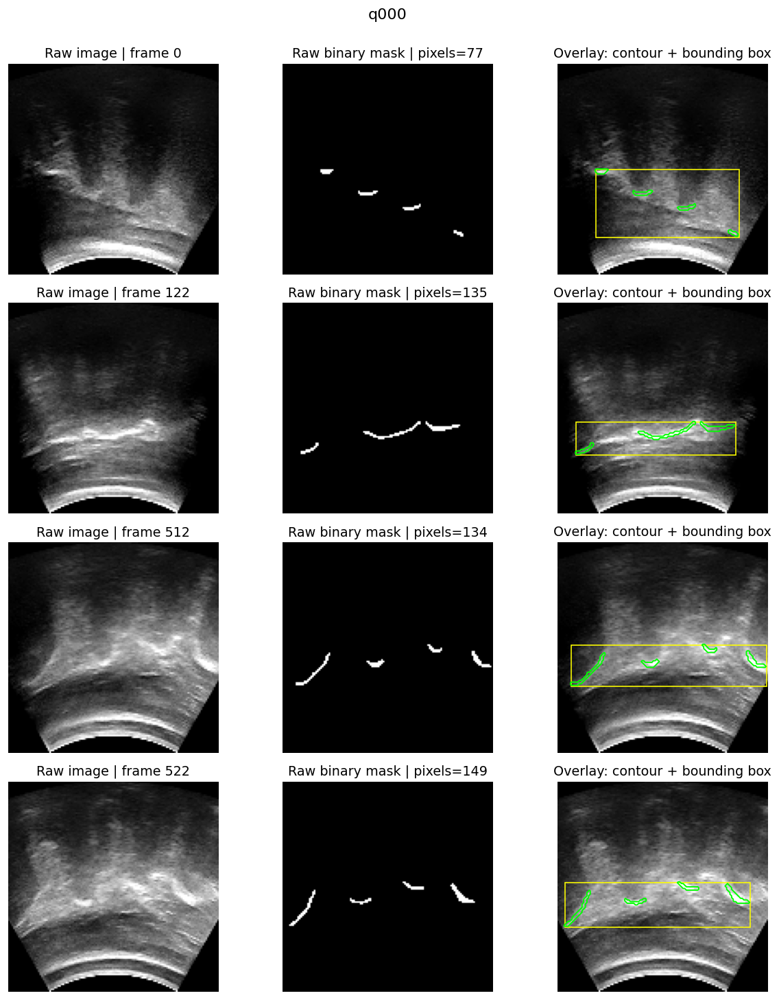

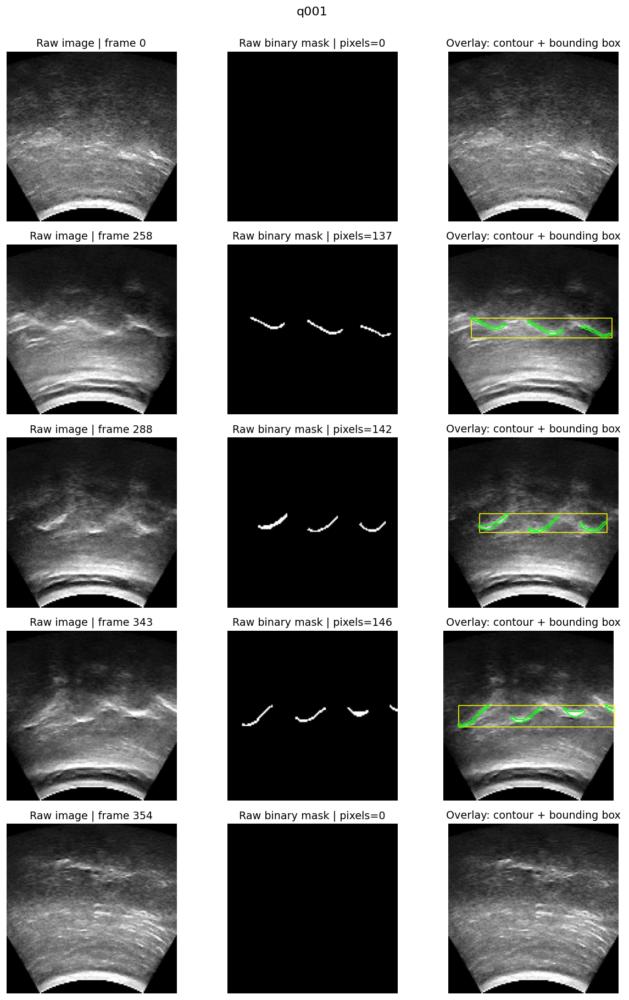

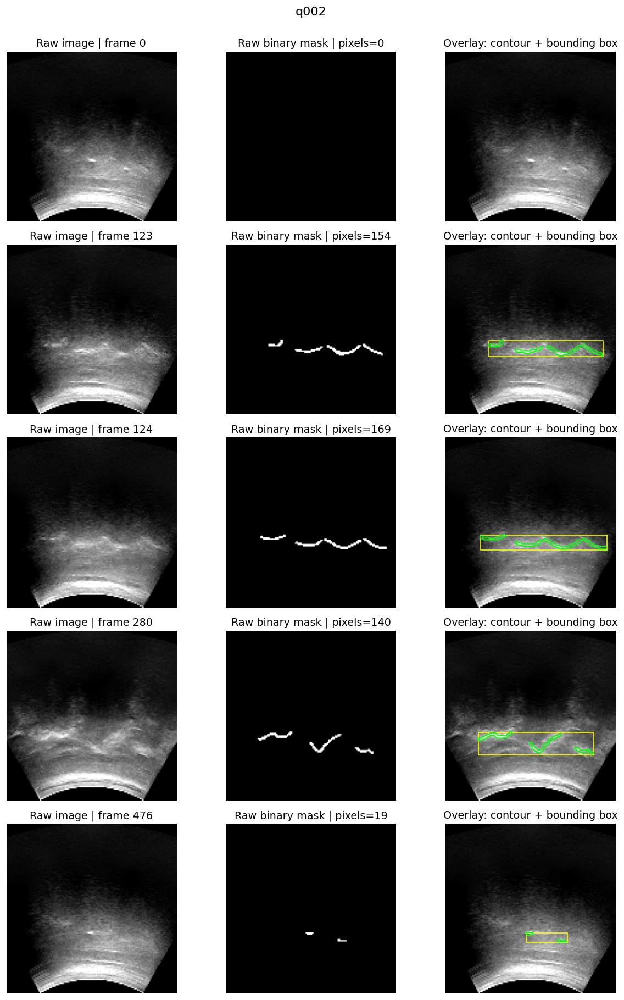

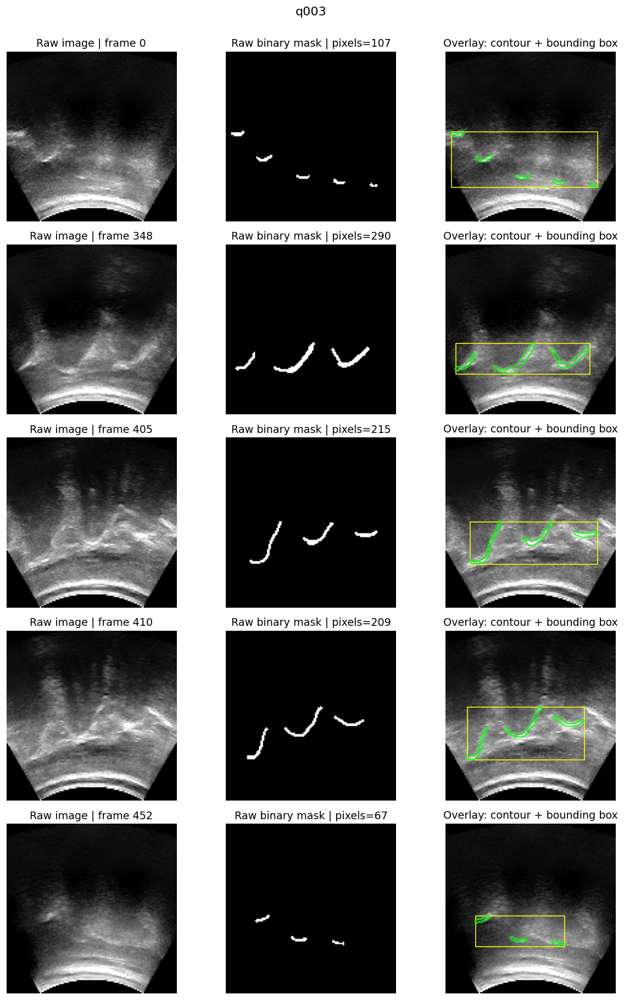

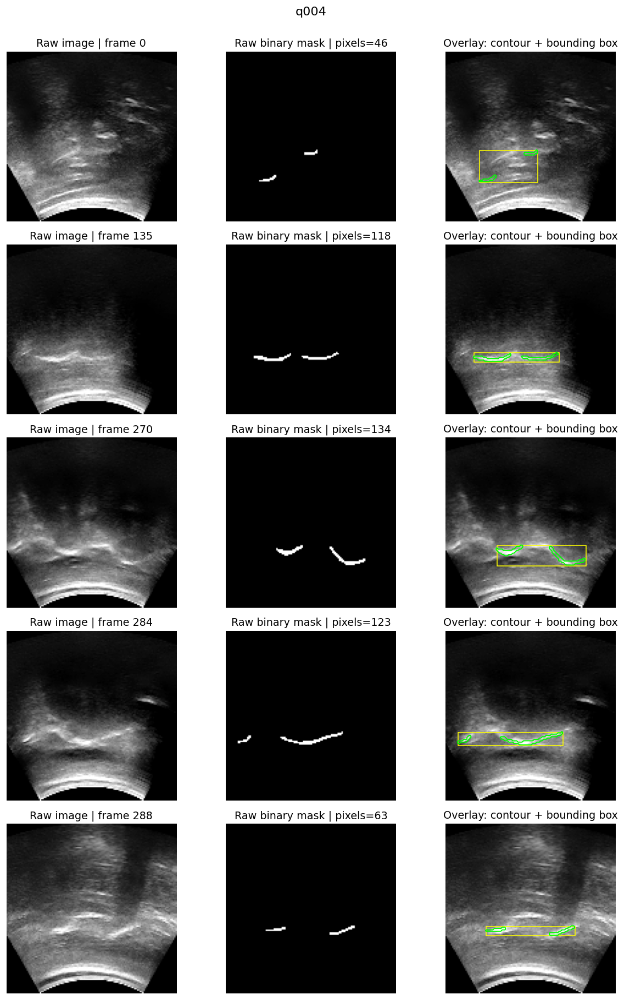

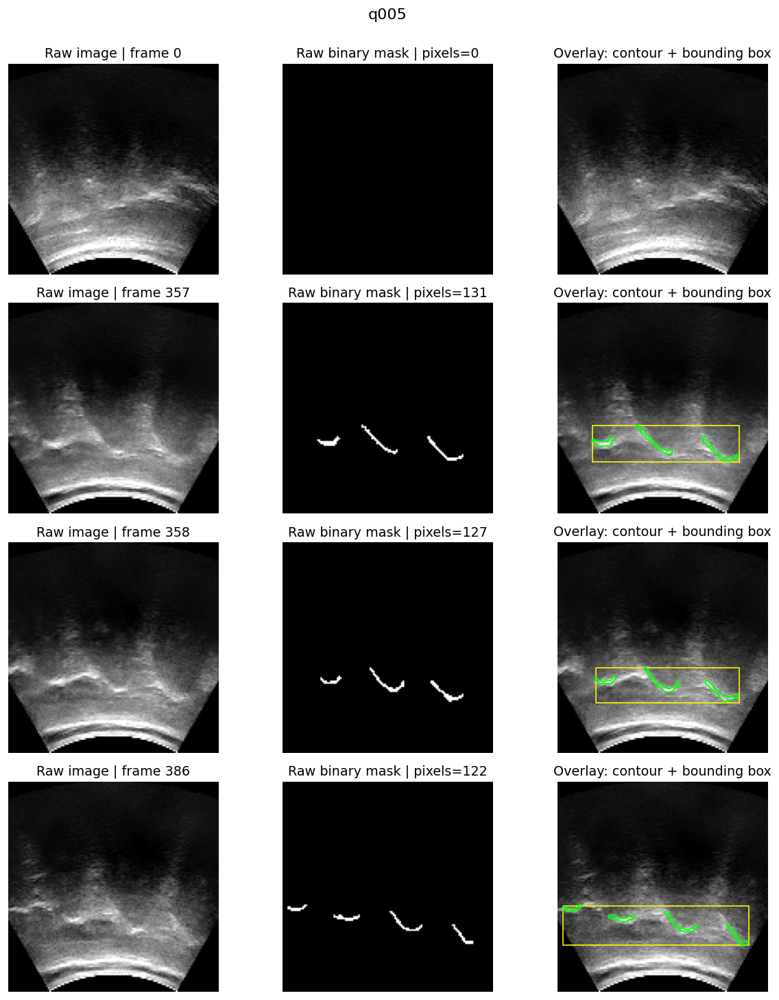

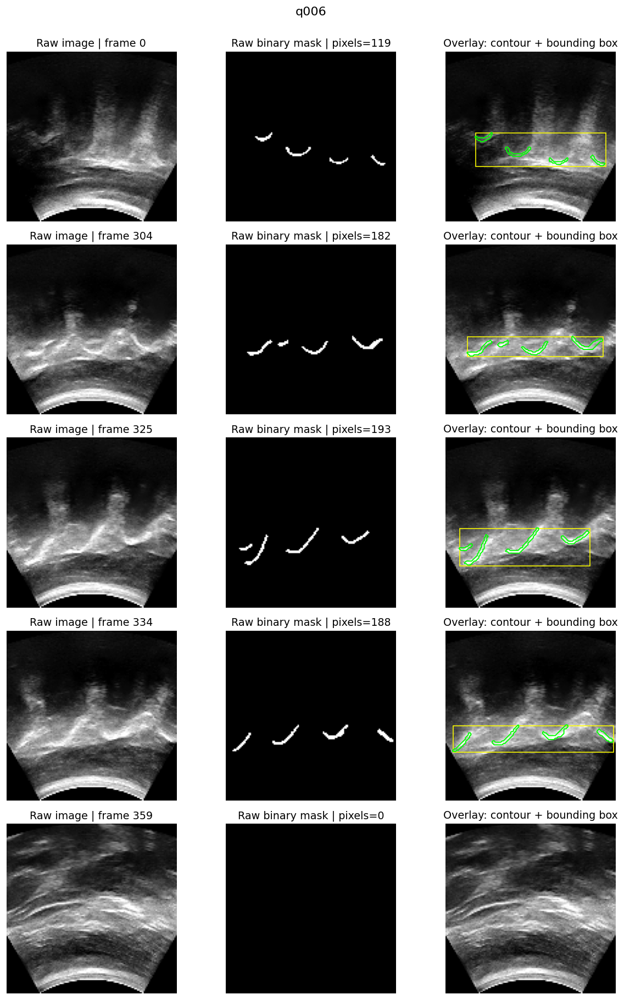

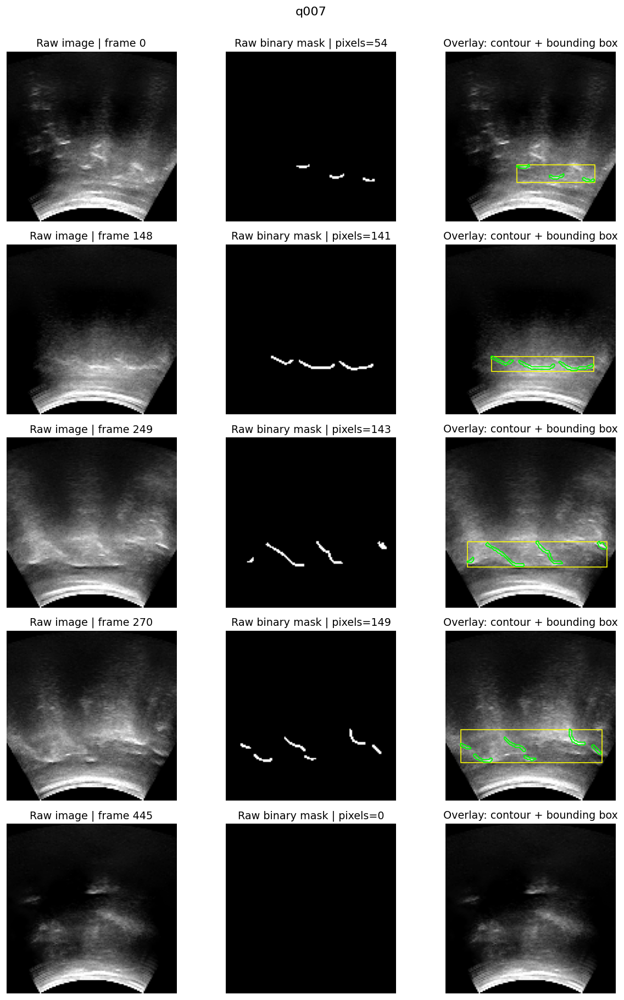

In [30]:
def robust_limits(image):
    lo, hi = np.percentile(image.astype(np.float32), [1, 99])
    return float(lo), float(max(hi, lo + 1e-6))


def qa_indices(case, n=QA_SAMPLES_PER_CASE):
    group = AUDIT[AUDIT.case == case].sort_values("frame_index").reset_index(drop=True)
    spread = np.linspace(0, len(group) - 1, min(max(2, n // 2), len(group)), dtype=int)
    positive = group.index[group.foreground_pixels > 0].to_numpy()
    top = np.array([], dtype=int)
    if len(positive):
        order = np.argsort(group.loc[positive, "foreground_pixels"].to_numpy())
        top = positive[order[-min(max(2, n - len(spread)), len(positive)):]]
    chosen = np.unique(np.concatenate([spread, top]))
    if len(chosen) > n:
        chosen = chosen[np.linspace(0, len(chosen) - 1, n, dtype=int)]
    return group.iloc[np.sort(chosen)]


def get_raw_frame(case, frame_index):
    image = image_to_gray(VOLUMES[case]["images"][int(frame_index)])
    mask = binary_mask_from_raw(mask_to_scalar(VOLUMES[case]["masks"][int(frame_index)]))
    return image, mask


def plot_case_raw_qa(case, n=QA_SAMPLES_PER_CASE):
    selected = qa_indices(case, n)
    fig, axes = plt.subplots(len(selected), 3, figsize=(11, 3.15 * len(selected)), squeeze=False)
    for row_i, record in enumerate(selected.itertuples(index=False)):
        image, mask = get_raw_frame(case, record.frame_index)
        lo, hi = robust_limits(image)
        bbox = bbox_from_binary(mask)

        axes[row_i, 0].imshow(image, cmap="gray", vmin=lo, vmax=hi)
        axes[row_i, 0].set_title(f"Raw image | frame {record.frame_index}")
        axes[row_i, 1].imshow(mask, cmap="gray", vmin=0, vmax=1)
        axes[row_i, 1].set_title(f"Raw binary mask | pixels={int(mask.sum())}")
        axes[row_i, 2].imshow(image, cmap="gray", vmin=lo, vmax=hi)
        if mask.any():
            axes[row_i, 2].contour(mask.astype(float), levels=[0.5], colors="lime", linewidths=1.2)
            y1, x1, y2, x2 = bbox
            axes[row_i, 2].add_patch(Rectangle((x1, y1), x2-x1, y2-y1,
                                                edgecolor="yellow", facecolor="none", linewidth=1.0))
        axes[row_i, 2].set_title("Overlay: contour + bounding box")
        for ax in axes[row_i]:
            ax.axis("off")
    fig.suptitle(case, fontsize=14, y=1.002)
    plt.tight_layout()
    plt.show()


for case in CASES:
    plot_case_raw_qa(case)


## 6. Optional focused pair viewer

Use this cell to inspect any suspicious sample at full size. Change the case and sample key to an entry shown in `AUDIT`.


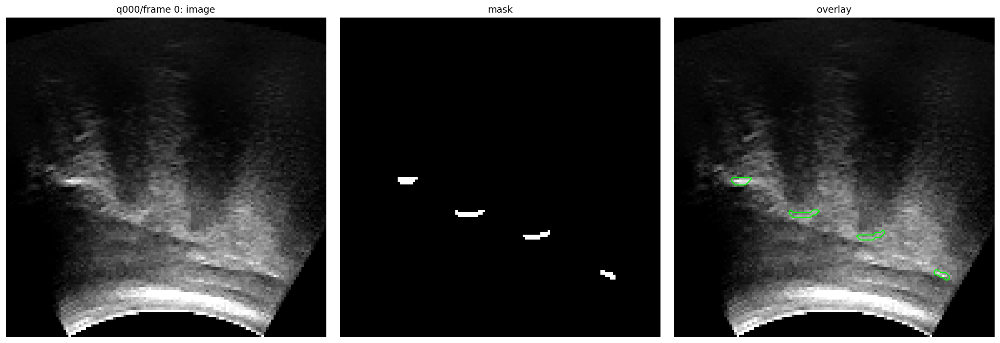

In [31]:
CASE_TO_INSPECT = CASES[0]
FRAME_TO_INSPECT = int(AUDIT.loc[AUDIT.case == CASE_TO_INSPECT, "frame_index"].iloc[0])

image, mask = get_raw_frame(CASE_TO_INSPECT, FRAME_TO_INSPECT)
lo, hi = robust_limits(image)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image, cmap="gray", vmin=lo, vmax=hi)
axes[0].set_title(f"{CASE_TO_INSPECT}/frame {FRAME_TO_INSPECT}: image")
axes[1].imshow(mask, cmap="gray")
axes[1].set_title("mask")
axes[2].imshow(image, cmap="gray", vmin=lo, vmax=hi)
if mask.any():
    axes[2].contour(mask.astype(float), [0.5], colors="lime", linewidths=1.3)
axes[2].set_title("overlay")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()


## 7. Choose conservative preprocessing

Defaults are designed to preserve anatomy:

- grayscale conversion only;
- image intensities mapped to `[0,1]` without CLAHE or denoising;
- no crop and no flip;
- if all samples already share one shape, only symmetric padding to a multiple of 16 is applied;
- if shapes differ, aspect-ratio-preserving letterboxing is used;
- masks use nearest-neighbor interpolation and are re-binarized afterward.

You may set `TARGET_SHAPE = (256, 256)` or another size after reviewing the shape table. Leaving it as `None` uses the automatic rule described above.


In [32]:
# Change only after reviewing all diagnostics and overlays.
CONFIRM_RAW_OVERLAYS_ARE_ALIGNED = True

TARGET_SHAPE = None              # None = automatic; or e.g. (256, 256)
MODEL_STRIDE = 16                # four pooling levels in a basic U-Net
SPATIAL_MODE = "letterbox"       # aspect-ratio preserving; no stretching
IMAGE_NORMALIZATION = "auto"     # dtype range for integer images; robust range for floats
PAD_IMAGE_VALUE = 0.0
PAD_MASK_VALUE = 0


def ceil_multiple(value, multiple):
    return int(math.ceil(value / multiple) * multiple)


def resolve_target_shape():
    if TARGET_SHAPE is not None:
        target = tuple(map(int, TARGET_SHAPE))
    else:
        shapes = [tuple(x) for x in AUDIT.image_shape]
        unique = sorted(set(shapes))
        if len(unique) == 1:
            h, w = unique[0]
            target = (ceil_multiple(h, MODEL_STRIDE), ceil_multiple(w, MODEL_STRIDE))
            print("All images share one native shape; automatic mode will pad only.")
        else:
            heights = np.array([h for h, _ in shapes])
            widths = np.array([w for _, w in shapes])
            target = (
                ceil_multiple(int(np.median(heights)), MODEL_STRIDE),
                ceil_multiple(int(np.median(widths)), MODEL_STRIDE),
            )
            warnings.warn(
                "Native shapes differ. Automatic mode selected a median-sized letterbox target. "
                "Review the preprocessing previews before export."
            )
    if len(target) != 2 or min(target) <= 0:
        raise ValueError(f"Invalid TARGET_SHAPE: {target}")
    if any(v % MODEL_STRIDE for v in target):
        raise ValueError(f"Target shape {target} is not divisible by MODEL_STRIDE={MODEL_STRIDE}")
    return target


RESOLVED_TARGET_SHAPE = resolve_target_shape()
print("Resolved output shape (H, W):", RESOLVED_TARGET_SHAPE)


All images share one native shape; automatic mode will pad only.
Resolved output shape (H, W): (128, 128)


In [33]:
def normalize_image(image):
    original = np.asarray(image)
    image = original.astype(np.float32)
    if IMAGE_NORMALIZATION != "auto":
        raise ValueError("Only IMAGE_NORMALIZATION='auto' is implemented in this audited notebook.")
    if np.issubdtype(original.dtype, np.integer):
        info = np.iinfo(original.dtype)
        image = (image - info.min) / float(info.max - info.min)
    else:
        observed_min, observed_max = float(np.min(image)), float(np.max(image))
        if observed_min >= 0 and observed_max <= 1.0 + 1e-6:
            pass
        else:
            lo, hi = np.percentile(image, [0.5, 99.5])
            if hi <= lo:
                return np.zeros_like(image, dtype=np.float32)
            image = (image - lo) / (hi - lo)
    return np.clip(image, 0.0, 1.0).astype(np.float32)


def resize_array(array, new_hw, is_mask):
    h, w = map(int, new_hw)
    interpolation = Image.Resampling.NEAREST if is_mask else Image.Resampling.BILINEAR
    source = Image.fromarray(
        array.astype(np.uint8) if is_mask else array.astype(np.float32),
        mode="L" if is_mask else "F",
    )
    return np.asarray(source.resize((w, h), resample=interpolation))


def letterbox_pair(image, mask, target_hw):
    target_h, target_w = target_hw
    h, w = image.shape
    if h > target_h or w > target_w:
        scale = min(target_h / h, target_w / w)
    else:
        scale = 1.0
    new_h = max(1, int(round(h * scale)))
    new_w = max(1, int(round(w * scale)))
    if (new_h, new_w) != (h, w):
        image = resize_array(image, (new_h, new_w), is_mask=False).astype(np.float32)
        mask = resize_array(mask, (new_h, new_w), is_mask=True).astype(np.uint8)
    top = (target_h - new_h) // 2
    left = (target_w - new_w) // 2
    bottom = target_h - new_h - top
    right = target_w - new_w - left
    image = np.pad(image, ((top, bottom), (left, right)), constant_values=PAD_IMAGE_VALUE)
    mask = np.pad(mask, ((top, bottom), (left, right)), constant_values=PAD_MASK_VALUE)
    transform = {
        "native_shape": [h, w], "resized_shape": [new_h, new_w],
        "scale": float(scale), "pad_top": top, "pad_bottom": bottom,
        "pad_left": left, "pad_right": right,
    }
    return image.astype(np.float32), (mask > 0).astype(np.uint8), transform


def preprocess_frame(case, frame_index):
    raw_image, raw_mask = get_raw_frame(case, frame_index)
    image = normalize_image(raw_image)
    mask = raw_mask.astype(np.uint8)
    if image.shape != mask.shape:
        raise ValueError(f"Image/mask shape mismatch: {image.shape} vs {mask.shape}")
    if SPATIAL_MODE != "letterbox":
        raise ValueError("Only SPATIAL_MODE='letterbox' is implemented for safe paired geometry.")
    image, mask, transform = letterbox_pair(image, mask, RESOLVED_TARGET_SHAPE)
    if image.shape != RESOLVED_TARGET_SHAPE or mask.shape != RESOLVED_TARGET_SHAPE:
        raise AssertionError("Preprocessing returned an unexpected shape")
    if not np.isfinite(image).all() or image.min() < 0 or image.max() > 1:
        raise AssertionError("Invalid normalized image")
    if not set(np.unique(mask)).issubset({0, 1}):
        raise AssertionError("Mask is not binary after preprocessing")
    return image, mask, transform


## 8. Preprocessing preview and confirmation gate

The preview shows the exact arrays that would be written. Padding is visible as black space. If a native image is larger than the chosen target, the title reports a scale below 1.0.


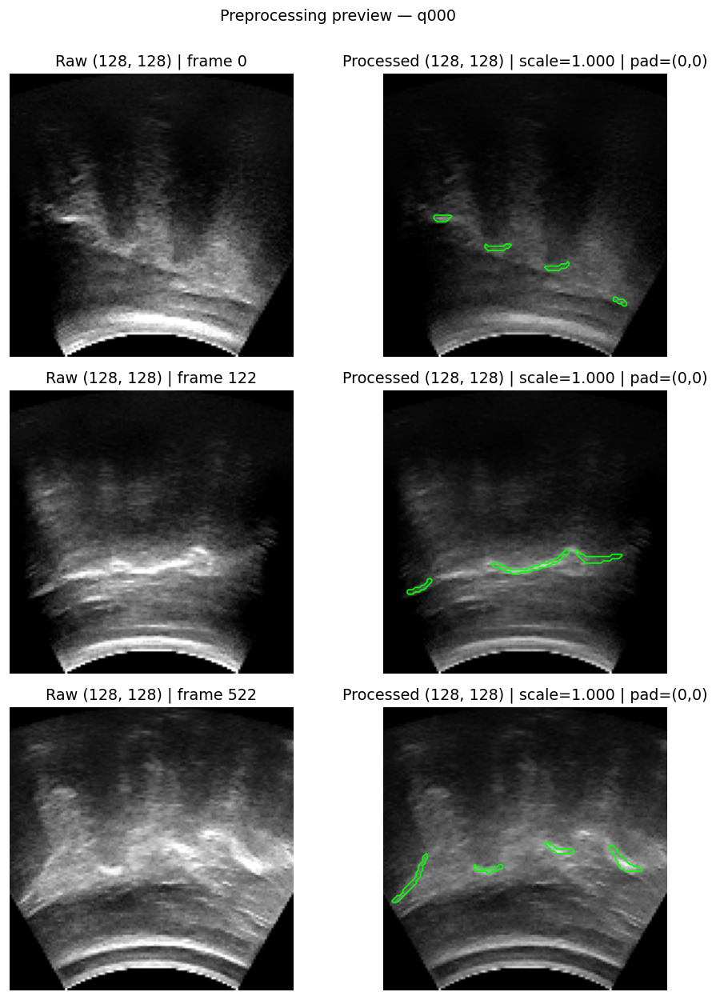

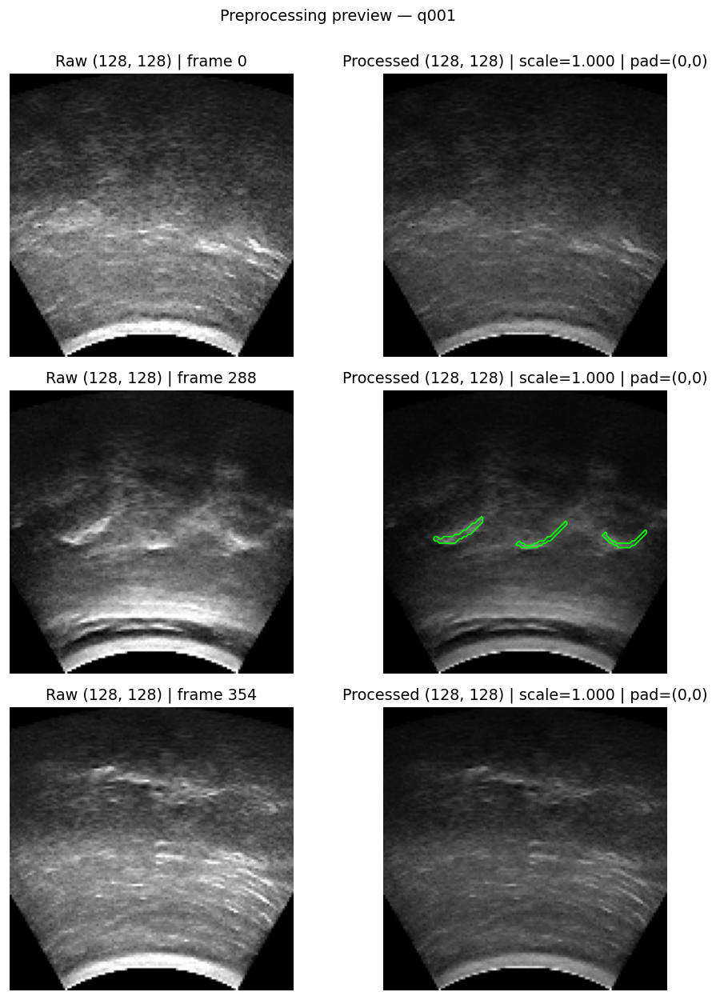

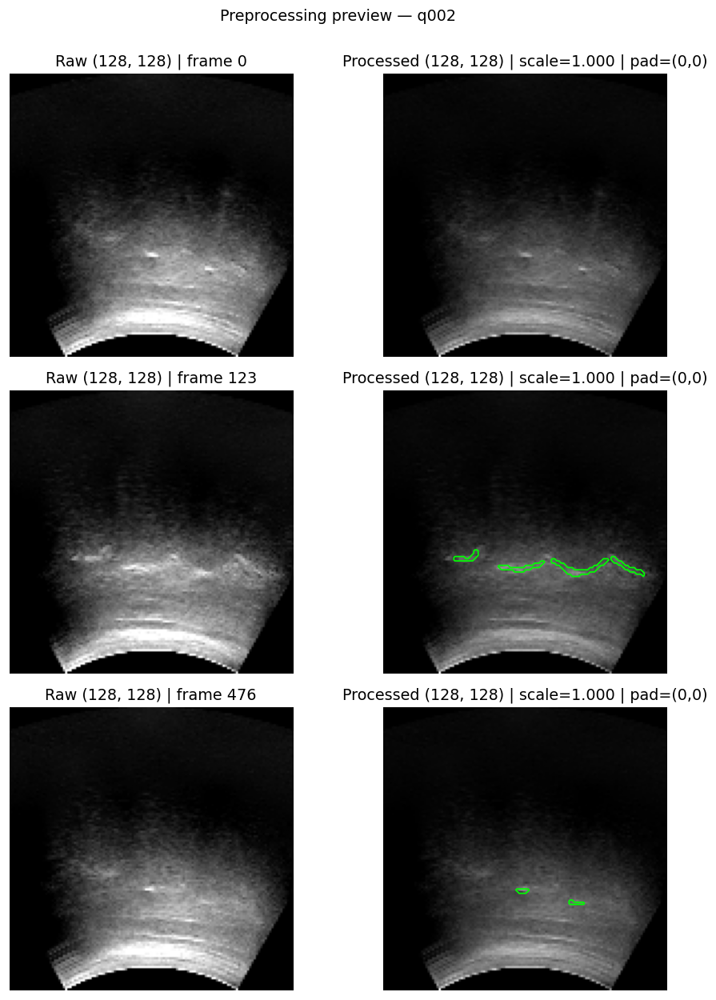

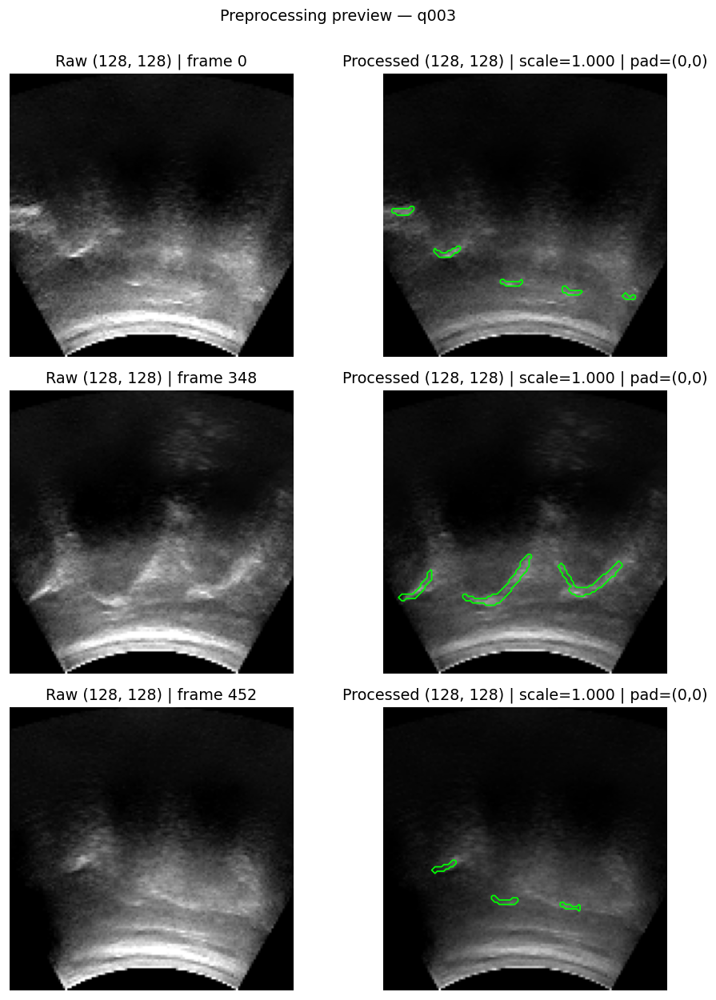

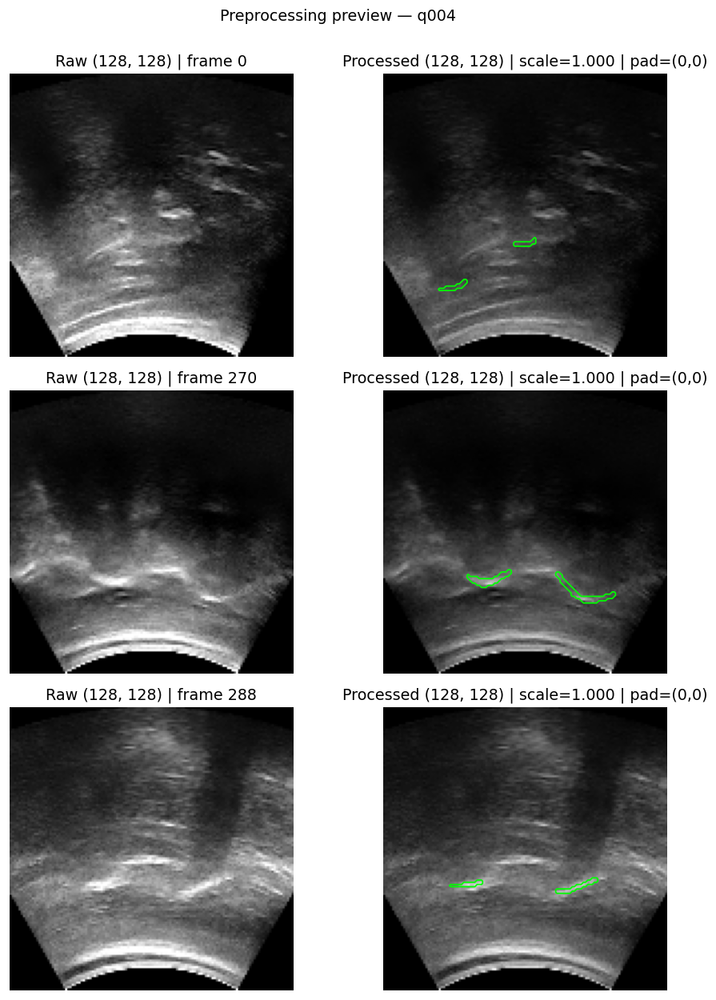

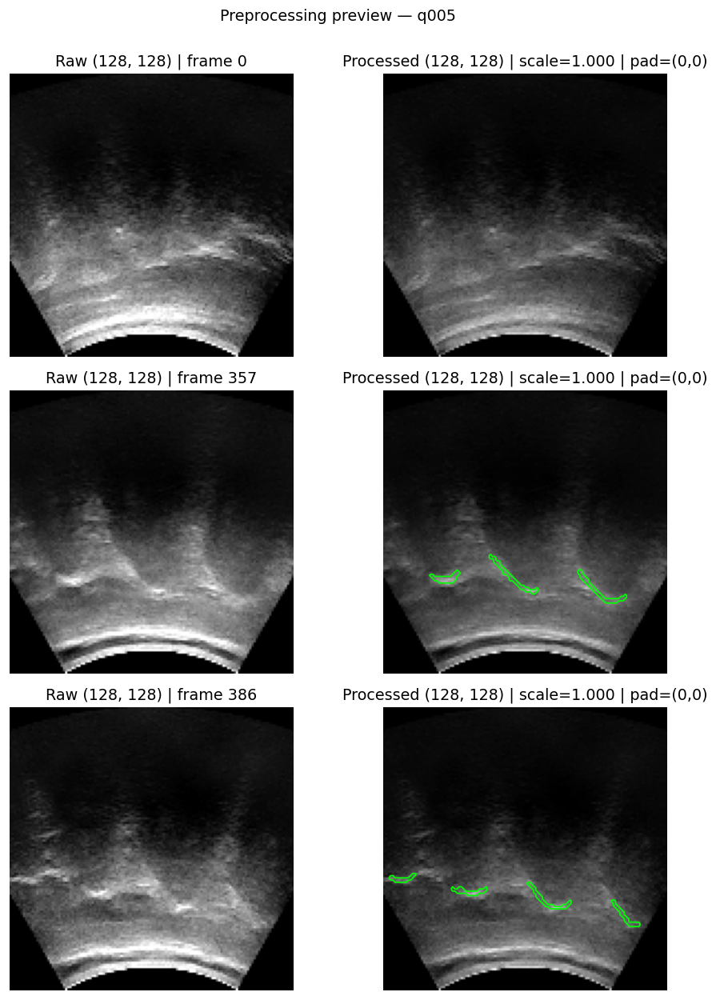

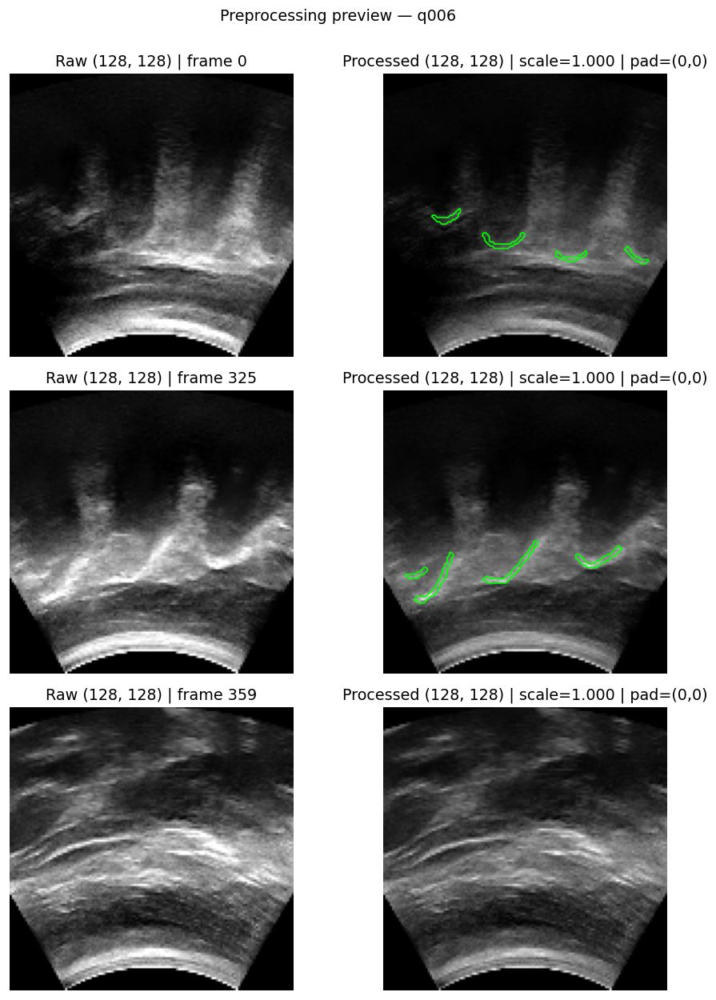

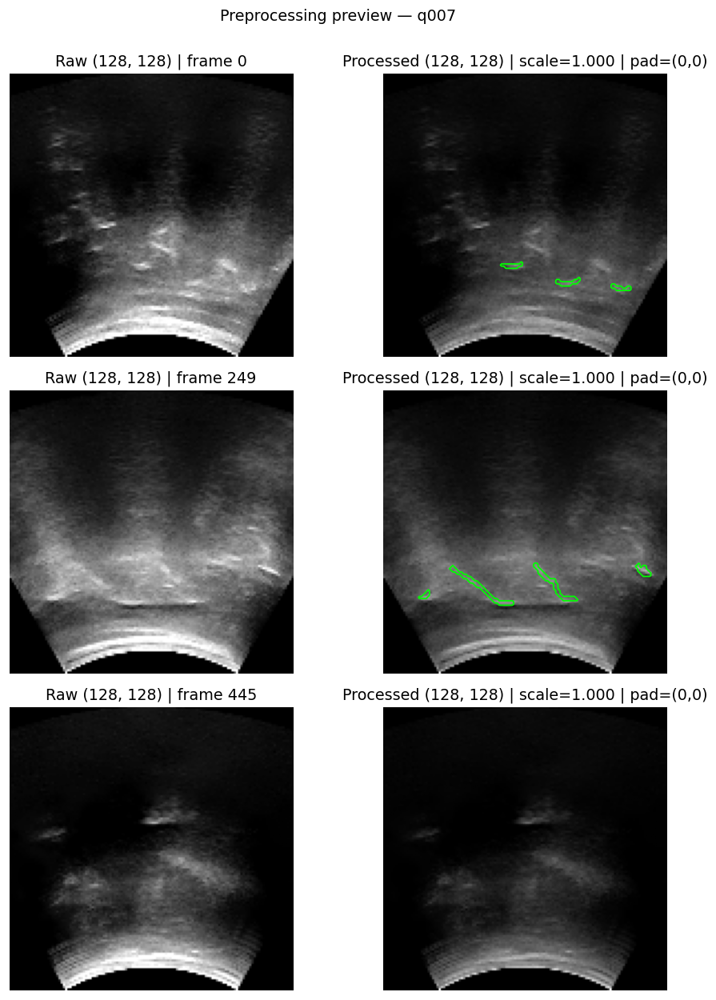

In [34]:
def plot_preprocessing_preview(case, n=3):
    selected = qa_indices(case, n)
    fig, axes = plt.subplots(len(selected), 2, figsize=(9, 3.6 * len(selected)), squeeze=False)
    for row_i, record in enumerate(selected.itertuples(index=False)):
        raw, _ = get_raw_frame(case, record.frame_index)
        image, mask, transform = preprocess_frame(case, record.frame_index)
        rlo, rhi = robust_limits(raw)
        axes[row_i, 0].imshow(raw, cmap="gray", vmin=rlo, vmax=rhi)
        axes[row_i, 0].set_title(f"Raw {raw.shape} | frame {record.frame_index}")
        axes[row_i, 1].imshow(image, cmap="gray", vmin=0, vmax=1)
        if mask.any():
            axes[row_i, 1].contour(mask.astype(float), [0.5], colors="lime", linewidths=1.1)
        axes[row_i, 1].set_title(
            f"Processed {image.shape} | scale={transform['scale']:.3f} | "
            f"pad=({transform['pad_top']},{transform['pad_left']})"
        )
        for ax in axes[row_i]:
            ax.axis("off")
    fig.suptitle(f"Preprocessing preview — {case}", y=1.002)
    plt.tight_layout()
    plt.show()


for case in CASES:
    plot_preprocessing_preview(case)

if not CONFIRM_RAW_OVERLAYS_ARE_ALIGNED:
    print(
        "EXPORT PAUSED (expected on the first run).\n"
        "Inspect all raw and processed overlays above. If image and mask anatomy align for every case, "
        "set CONFIRM_RAW_OVERLAYS_ARE_ALIGNED = True and rerun from Section 7."
    )


## 9. Strict pre-export gate

This gate prevents export until visual confirmation is recorded. Exact duplicate images across cases are treated as a blocker because they can invalidate case-wise evaluation. If duplicates are genuine repeated acquisitions, investigate and remove or group them deliberately rather than bypassing the check.


In [35]:
if not CONFIRM_RAW_OVERLAYS_ARE_ALIGNED:
    raise RuntimeError(
        "Export not authorized: inspect the overlays, set "
        "CONFIRM_RAW_OVERLAYS_ARE_ALIGNED=True, then rerun from Section 7."
    )
if len(cross_case_image_duplicates):
    raise RuntimeError(
        "Non-constant cross-case duplicate images detected. Resolve this leakage risk before export."
    )
if len(CASES) < 3:
    raise RuntimeError("At least three independent cases are needed for train/validation/test grouping.")
print("Pre-export gate passed.")


Pre-export gate passed.


## 10. Export case-grouped arrays and metadata

Each case receives one memory-mapped float32 image array and one uint8 mask array. Keeping the case boundary explicit prevents frame-level leakage later. The manifest records the original file path, transform, hashes, and output index.


In [36]:
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)
manifest_rows = []

for case in CASES:
    case_rows = AUDIT[AUDIT.case == case].sort_values("frame_index").reset_index(drop=True)
    n = len(case_rows)
    h, w = RESOLVED_TARGET_SHAPE
    image_path = OUTPUT_ROOT / f"{case}_images.npy"
    mask_path = OUTPUT_ROOT / f"{case}_masks.npy"
    images_out = open_memmap(image_path, mode="w+", dtype=np.float32, shape=(n, h, w, 1))
    masks_out = open_memmap(mask_path, mode="w+", dtype=np.uint8, shape=(n, h, w, 1))
    transforms = []

    for output_index, record in enumerate(case_rows.itertuples(index=False)):
        image, mask, transform = preprocess_frame(case, record.frame_index)
        images_out[output_index, ..., 0] = image
        masks_out[output_index, ..., 0] = mask
        transforms.append({
            "frame_index": int(record.frame_index),
            "sample_key": record.sample_key,
            **transform,
        })
        manifest_rows.append({
            "case": case,
            "output_index": output_index,
            "source_frame_index": int(record.frame_index),
            "sample_key": record.sample_key,
            "source_image_volume": str(record.image_path),
            "source_mask_volume": str(record.mask_path),
            "image_array": image_path.name,
            "mask_array": mask_path.name,
            "native_shape": str(transform["native_shape"]),
            "scale": transform["scale"],
            "pad_top": transform["pad_top"],
            "pad_bottom": transform["pad_bottom"],
            "pad_left": transform["pad_left"],
            "pad_right": transform["pad_right"],
            "foreground_pixels_processed": int(mask.sum()),
            "image_hash_raw": record.image_hash,
            "mask_hash_binary_raw": record.mask_hash,
        })
    images_out.flush()
    masks_out.flush()
    del images_out, masks_out

    metadata = {
        "case": case,
        "samples": n,
        "array_shape": [n, h, w, 1],
        "image_dtype": "float32",
        "image_range": [0.0, 1.0],
        "mask_dtype": "uint8",
        "mask_values": [0, 1],
        "target_shape": [h, w],
        "spatial_mode": SPATIAL_MODE,
        "normalization": IMAGE_NORMALIZATION,
        "no_crop": True,
        "no_flip": True,
        "transforms": transforms,
    }
    (OUTPUT_ROOT / f"{case}_metadata.json").write_text(json.dumps(metadata, indent=2), encoding="utf-8")
    print(f"{case}: exported {n} frames")

MANIFEST = pd.DataFrame(manifest_rows)
MANIFEST.to_csv(OUTPUT_ROOT / "manifest.csv", index=False)
summary.to_csv(OUTPUT_ROOT / "raw_audit_summary_by_case.csv")
AUDIT.drop(columns=["image_path", "mask_path"]).to_csv(
    OUTPUT_ROOT / "raw_audit_per_frame.csv", index=False
)
VOLUME_INVENTORY.to_csv(OUTPUT_ROOT / "raw_volume_inventory.csv")
print("Export directory:", OUTPUT_ROOT)


q000: exported 523 frames
q001: exported 355 frames
q002: exported 477 frames
q003: exported 453 frames
q004: exported 289 frames
q005: exported 387 frames
q006: exported 360 frames
q007: exported 446 frames
Export directory: /kaggle/working/ungi_spine_preprocessed


## 11. Build leakage-safe fold metadata

With eight case groups, a practical baseline is outer leave-one-case-out evaluation. For each outer fold, one of the remaining cases is reserved for validation and the other cases train the model. No image from the held-out test case appears in training or validation.


In [37]:
case_order = sorted(CASES, key=natural_key)
folds = []
for test_index, test_case in enumerate(case_order):
    validation_case = case_order[(test_index + 1) % len(case_order)]
    train_cases = [case for case in case_order if case not in {test_case, validation_case}]
    folds.append({
        "fold": test_index,
        "train_cases": train_cases,
        "validation_case": validation_case,
        "test_case": test_case,
    })

(OUTPUT_ROOT / "group_folds.json").write_text(json.dumps(folds, indent=2), encoding="utf-8")
display(pd.DataFrame(folds))

for fold in folds:
    groups = [set(fold["train_cases"]), {fold["validation_case"]}, {fold["test_case"]}]
    assert not (groups[0] & groups[1] or groups[0] & groups[2] or groups[1] & groups[2])
print("All case-wise folds are disjoint.")


,fold,train_cases,validation_case,test_case
0,0,"[q002, q003, q004, q005, q006, q007]",q001,q000
1,1,"[q000, q003, q004, q005, q006, q007]",q002,q001
2,2,"[q000, q001, q004, q005, q006, q007]",q003,q002
3,3,"[q000, q001, q002, q005, q006, q007]",q004,q003
4,4,"[q000, q001, q002, q003, q006, q007]",q005,q004
5,5,"[q000, q001, q002, q003, q004, q007]",q006,q005
6,6,"[q000, q001, q002, q003, q004, q005]",q007,q006
7,7,"[q001, q002, q003, q004, q005, q006]",q000,q007


All case-wise folds are disjoint.


## 12. Reload and verify every exported value

The saved arrays are opened again to verify shapes, dtypes, finite values, binary masks, and sample counts. A final grid uses exported—not in-memory—data.


In [38]:
verification_rows = []
for case in CASES:
    images = np.load(OUTPUT_ROOT / f"{case}_images.npy", mmap_mode="r", allow_pickle=False)
    masks = np.load(OUTPUT_ROOT / f"{case}_masks.npy", mmap_mode="r", allow_pickle=False)
    expected_n = int((MANIFEST.case == case).sum())
    expected_shape = (expected_n, *RESOLVED_TARGET_SHAPE, 1)
    if images.shape != expected_shape or masks.shape != expected_shape:
        raise AssertionError(f"{case}: unexpected saved shapes {images.shape}, {masks.shape}")
    if images.dtype != np.float32 or masks.dtype != np.uint8:
        raise AssertionError(f"{case}: unexpected dtypes {images.dtype}, {masks.dtype}")
    if not np.isfinite(images).all() or float(images.min()) < 0 or float(images.max()) > 1:
        raise AssertionError(f"{case}: invalid saved image range")
    if not set(np.unique(masks)).issubset({0, 1}):
        raise AssertionError(f"{case}: masks are not binary")
    verification_rows.append({
        "case": case, "samples": expected_n, "shape": images.shape,
        "image_min": float(images.min()), "image_max": float(images.max()),
        "foreground_pixels": int(masks.sum()),
    })

verification_df = pd.DataFrame(verification_rows)
display(verification_df)
print("Export verification passed for every case.")


,case,samples,shape,image_min,image_max,foreground_pixels
0,q000,523,"(523, 128, 128, 1)",0.0,1.0,23983
1,q001,355,"(355, 128, 128, 1)",0.0,1.0,14561
2,q002,477,"(477, 128, 128, 1)",0.0,1.0,22485
3,q003,453,"(453, 128, 128, 1)",0.0,1.0,29795
4,q004,289,"(289, 128, 128, 1)",0.0,1.0,12342
5,q005,387,"(387, 128, 128, 1)",0.0,1.0,22694
6,q006,360,"(360, 128, 128, 1)",0.0,1.0,24965
7,q007,446,"(446, 128, 128, 1)",0.0,1.0,30154


Export verification passed for every case.


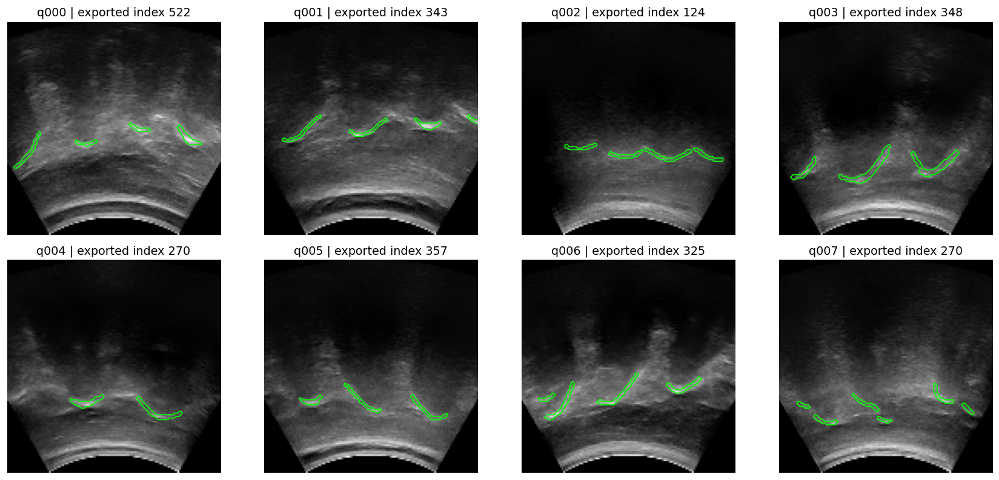

In [39]:
fig, axes = plt.subplots(2, 4, figsize=(15, 7), squeeze=False)
for ax, case in zip(axes.ravel(), CASES):
    images = np.load(OUTPUT_ROOT / f"{case}_images.npy", mmap_mode="r", allow_pickle=False)
    masks = np.load(OUTPUT_ROOT / f"{case}_masks.npy", mmap_mode="r", allow_pickle=False)
    counts = masks[..., 0].sum(axis=(1, 2))
    idx = int(np.argmax(counts))
    ax.imshow(images[idx, ..., 0], cmap="gray", vmin=0, vmax=1)
    if masks[idx, ..., 0].any():
        ax.contour(masks[idx, ..., 0].astype(float), [0.5], colors="lime", linewidths=1.1)
    ax.set_title(f"{case} | exported index {idx}")
    ax.axis("off")
for ax in axes.ravel()[len(CASES):]:
    ax.axis("off")
plt.tight_layout()
plt.show()


## 13. Package the preprocessing output

The ZIP contains the case arrays, metadata, audits, manifest, and group folds. Model training should use `group_folds.json`; do not create a random image-level split.


In [40]:
import shutil

archive = shutil.make_archive(str(OUTPUT_ROOT), "zip", root_dir=OUTPUT_ROOT)
print("Created:", archive)
print("Next stage: build a U-Net DataLoader that reads these case arrays and uses group_folds.json.")


Created: /kaggle/working/ungi_spine_preprocessed.zip
Next stage: build a U-Net DataLoader that reads these case arrays and uses group_folds.json.


## Interpretation checklist before the U-Net notebook

Proceed only when all are true:

1. every image has exactly one correct mask;
2. raw overlays align in all eight cases without a flip or shift;
3. empty masks are clinically/dataset-wise expected;
4. no cross-case duplicates remain;
5. processed previews preserve anatomy and do not crop the label;
6. the export verifier passes;
7. later train/validation/test splits are made only by `q...` case.

Do not add CLAHE, speckle filtering, cropping, or aggressive augmentation until the raw conservative baseline is established. Those should be separate ablations, not hidden preprocessing assumptions.
